# Assess Electrical Stimulation Selectivity

In [1]:
%reload_ext autoreload
%autoreload 2

# Imports
import numpy as np
import visionloader as vl
import matplotlib.pyplot as plt
import os
import matplotlib.cm as cm
from tqdm import tqdm
from matplotlib.lines import Line2D
from matplotlib.patches import Ellipse

import src.sigmoid as sig
import src.eilib as eil

In [2]:
piece = '2025-01-22-1'
analysis_base = f"/Volumes/Stream/Analysis/RETINA/{piece}"
pp_base = analysis_base
gsort_base = analysis_base
pickle_path_base = "gsort_single_v2"

wnoise = 'data003'
estim = 'data005'
cell_types = ['ON alpha', 'OFF alpha']

wnoise_path = os.path.join(analysis_base, wnoise)
pp_path = os.path.join(pp_base, estim)
gsort_path = os.path.join(gsort_base, "gsort", estim)

In [3]:
amplitudes = np.array([0.09375, 0.1875, 0.28125, 0.375, 0.46875, 0.5625, 0.65625, 0.75, 0.84375, 0.9375,
        1.03125, 1.125, 1.21875, 1.3125, 1.40625, 1.5, 1.59375, 1.6875, 1.78125, 1.875, 1.96875,
        2.0625, 2.15625, 2.25, 2.34375, 2.4375, 2.53125, 2.625, 2.71875, 2.8125, 2.90625, 3.0,
        3.09375, 3.1875, 3.28125, 3.375, 3.46875, 3.5625, 3.65625, 3.75, 3.84375, 3.9375])

dict_path = os.path.join(analysis_base, "dictionary")

with np.load(os.path.join(dict_path,f"{wnoise}_bundle_thresholds.npz")) as data:
    # bundle_thresholds: (np.array) containing thresholds generated by algorithm with shape 519x2 (col 0: elec || col 1: first amplitude index with bundle activity)
    # last 7 rows are not used
    bundle = data["bundle_thresholds"]

bundle_thresholds = amplitudes[bundle[:512,1].astype(int)-1] # subtract 1 to get the last amplitude index with no bundle activity
bundle_thresholds[bundle[:512,1].astype(int) == -1] = amplitudes[-1] # if no detected bundle activity, set to max amplitude

In [4]:
vcd = vl.load_vision_data(wnoise_path,wnoise,
                        include_neurons=True,
                        include_ei=True,
                        include_params=True,
                        include_runtimemovie_params=True,
                        include_noise=True)

# Determine desired cell ids
cell_ids = sorted(vcd.get_all_cells_similar_to_type("alpha"))

# Print cell IDs
print(cell_ids)
print(len(cell_ids))

[1832, 2116, 2326, 2509, 7231, 7411, 7651]
7


In [5]:
cell_id = cell_ids[0]
patterns = sig.find_activating_patterns(gsort_path, cell_id)
patterns = np.sort(patterns)
pattern_nos = [int(p.split('p')[-1]) for p in patterns]
print(pattern_nos)

[100, 105, 106, 111, 119, 120, 123, 124, 125, 126, 131, 132, 177, 200, 213, 214, 223, 224, 232, 233, 268, 273, 274, 278, 279, 280, 281, 283, 284, 285, 286, 287, 288, 289, 290, 293, 294, 295, 297, 298]


In [33]:
def evaluate_single_electrode(electrode, activated_cells, bundle_thresholds, num_std=4, selectivity_ratio=2, obey_bundle=True, plot=False):

    # Get the number of activated cells
    num_cells = len(activated_cells)

    # Store the slp, thr, and std values for each sigmoid curve in 2D numpy array
    slp_thr_std = np.zeros((num_cells, 3))

    success_flag = True

    if plot:
        fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(5,5))

        # Create a colormap with a unique color for each sigmoid curve
        colors = cm.rainbow(np.linspace(0, 1, num_cells))

        # Annotate bundle threshold
        ax.axvline(bundle_thresholds[transform_from_519([electrode])[0]-1], color='black', linestyle='--')

    for i, c in enumerate(activated_cells):
        try:
            amps, probs, slp, thr, scale, success = sig.compute_sigmoid(gsort_path, pickle_path_base, c, f"p{electrode}", plot=False, cosine=True)

            # if not success:
            #     success_flag = False

            # std = scale * np.pi / np.sqrt(3) # Standard deviation of logistic function
            std = 1 / slp # Inverse of slope

            slp_thr_std[i, 0] = slp
            slp_thr_std[i, 1] = thr
            slp_thr_std[i, 2] = std

            if plot:
                color = colors[i]  # Get the color for the current sigmoid curve
                sig.plot_sigmoid(ax, amps, probs, slp, thr, color, label=f"Cell {c}")
                
                # # Plot the plus or minus standard deviations
                # ax.fill_betweenx(probs, thr - num_std*std, thr + num_std*std, color=color, alpha=0.2)

                # For manuscript
                # if c == 2404:
                #     color = 'red'  # Get the color for the current sigmoid curve
                # elif c == 2270:
                #     color = 'blue'
                # else:
                #     color = 'gray'
                # sig.plot_sigmoid(ax, amps, probs, slp, thr, color, label=f"Cell {c}")

        except Exception as ex:
            slp_thr_std[i, 0] = np.nan
            slp_thr_std[i, 1] = np.nan
            slp_thr_std[i, 2] = np.nan
            
            if plot:
                ax.text(0.1,0.1,str(ex))

            continue

    if plot:
        ax.set_xlim(0,4)
        ax.set_ylim(0,1.01)
        ax.set_xlabel('Stimulation Amplitude (uA)')
        ax.set_ylabel('Activation Probability')
        ax.legend()
        ax.set_title(f"Electrode {electrode}")

        # Make labels, axes, and title bigger
        ax.tick_params(axis='both', which='major', labelsize=20)
        ax.set_xlabel(ax.get_xlabel(), fontsize=20)
        ax.set_ylabel(ax.get_ylabel(), fontsize=20)
        ax.set_title(ax.get_title(), fontsize=20)

        plt.show()

    # Check sigmoids for selectivity
    try:
        min_thr_index = np.nanargmin(slp_thr_std[:, 1])
    except:
        return np.nan, np.nan, np.nan, np.nan

    min_thr = slp_thr_std[min_thr_index, 1]
    min_thr_cell = activated_cells[min_thr_index]

    min_thr_plus = min_thr + num_std*slp_thr_std[min_thr_index, 2]
    thresholds_minus = slp_thr_std[:, 1] - num_std*slp_thr_std[:, 2]

    if obey_bundle:
        if min_thr_plus > bundle_thresholds[transform_from_519([electrode])[0]-1]:
            return False, False, min_thr_cell, np.nan

    thresholds_minus_without = thresholds_minus[np.arange(num_cells)!=min_thr_index]
    pure = np.all(min_thr_plus < thresholds_minus_without[np.logical_not(np.isnan(thresholds_minus_without))])

    if pure:
        selective = True

        # # The stimulation current should bisect the target and closest higher non-target or bundle threshold boundaries for robustness
        # upper_bound = np.max([bundle_thresholds[transform_from_519([electrode])[0]-1], min_thr_plus])

        # if np.all(np.isnan(thresholds_minus_without)):
        #     min_thr_plus = (min_thr_plus + upper_bound) / 2
        # else:
        #     upper_bound = np.min([upper_bound, np.nanmin(thresholds_minus_without)])
        #     min_thr_plus = (min_thr_plus + upper_bound) / 2

        if obey_bundle:
            # If no non-target, bisect the target and bundle threshold
            if np.all(np.isnan(thresholds_minus_without)):
                min_thr_plus = (min_thr_plus + bundle_thresholds[transform_from_519([electrode])[0]-1]) / 2
            # Else bisect the target and closest higher non-target or bundle threshold
            else:
                upper_bound = np.min([bundle_thresholds[transform_from_519([electrode])[0]-1], np.nanmin(thresholds_minus_without)])
                min_thr_plus = (min_thr_plus + upper_bound) / 2

        else:
            # If no non-target, bisect the target and max current amplitude
            if np.all(np.isnan(thresholds_minus_without)):
                min_thr_plus = (min_thr_plus + amplitudes[-1]) / 2
            # Else bisect the target and closest higher non-target
            else:
                min_thr_plus = (min_thr_plus + np.nanmin(thresholds_minus_without)) / 2

    else:
        target_activation = sig.fsigmoid(min_thr_plus,slp_thr_std[min_thr_index, 0],slp_thr_std[min_thr_index, 1])
        for j, d in enumerate(activated_cells):
            if j != min_thr_index and not np.isnan(thresholds_minus[j]):
                if target_activation > selectivity_ratio * sig.fsigmoid(min_thr_plus,slp_thr_std[j, 0],slp_thr_std[j, 1]):
                    selective = True
                else:
                    selective = False
                    break

    if not success_flag:
        selective = False

    return selective, pure, min_thr_cell, min_thr_plus

def transform_to_519(electrode):
    skip_elecs = np.array([1, 130, 259, 260, 389, 390, 519])
    elecs = np.arange(1, 520)
    elecs = elecs[~np.isin(elecs, skip_elecs)]
    return elecs[electrode-1]

def transform_from_519(electrodes):
    skip_elecs = np.array([1, 130, 259, 260, 389, 390, 519])
    elecs = np.arange(1, 520)
    elecs = elecs[~np.isin(elecs, skip_elecs)]

    patterns = []
    for electrode in electrodes:
        patterns.append(np.where(elecs == electrode)[0][0] + 1)
    return np.array(patterns)

[7411 7651]


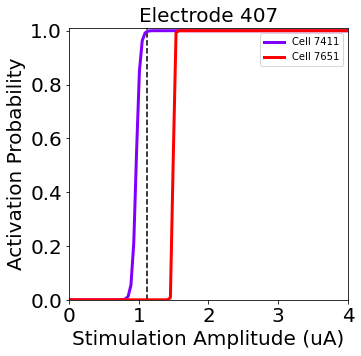

Electrode 407
Selective: True
Pure: True
Cell 7411 at 1.27 uA


In [36]:
electrode = transform_to_519(401)
activated_cells = sig.find_activating_cells(gsort_path, electrode)
activated_cells = np.sort(activated_cells)
print(activated_cells)

selective, pure, cell, amp = evaluate_single_electrode(electrode, activated_cells, bundle_thresholds, num_std=4, selectivity_ratio=np.inf, obey_bundle=False, plot=True)
print(f"Electrode {electrode}")
print(f"Selective: {selective}")
print(f"Pure: {pure}")
print(f"Cell {cell} at {amp:.2f} uA")

In [20]:
# for electrode in range(1, 50):
#     electrode = transform_to_519(electrode)
#     activated_cells = sig.find_activating_cells(gsort_path, electrode)
#     activated_cells = np.sort(activated_cells)

#     selective, pure, cell, amp = evaluate_single_electrode(electrode, activated_cells, bundle_thresholds, num_std=4, selectivity_ratio=np.inf, obey_bundle=True, plot=False)
#     print(f"Electrode {electrode}")
#     print(f"Selective: {selective}")
#     print(f"Pure: {pure}")
#     print(f"Cell {cell} at {amp:.2f} uA")
#     print("-------------------------")

In [15]:
selective_stimuli = []

for electrode in tqdm(range(1, 513)):
    electrode = transform_to_519(electrode)
    activated_cells = sig.find_activating_cells(gsort_path, electrode)
    activated_cells = np.sort(activated_cells)

    selective, pure, cell, amp = evaluate_single_electrode(electrode, activated_cells, bundle_thresholds, num_std=4, selectivity_ratio=np.inf, obey_bundle=False, plot=False)
    if not np.isnan(selective) and selective:
        selective_stimuli += [electrode, cell, amp, pure]

selective_stimuli = np.array(selective_stimuli).reshape(-1, 4)

100%|██████████| 512/512 [00:18<00:00, 28.04it/s] 


In [16]:
selective_stimuli = selective_stimuli[selective_stimuli[:,2] <= 3.9375]
selective_stimuli = selective_stimuli[selective_stimuli[:,2] >= 0.09375]

In [17]:
# Tell me how many unique cells are activated by selective stimuli and how many of those are in cell_ids
unique_cells = np.unique(selective_stimuli[:,1])
print(f"There are {len(unique_cells)} cells activated by selective stimuli and {len(np.intersect1d(unique_cells, cell_ids))} of those are in cell_ids")

# Tell me how unique cells can be activated by a pure selective stimuli
pure_selective_stimuli = selective_stimuli[selective_stimuli[:,3] == 1]
pure_unique_cells = np.unique(pure_selective_stimuli[:,1])
print(f"There are {len(pure_unique_cells)} cells activated by pure selective stimuli and {len(np.intersect1d(pure_unique_cells, cell_ids))} of those are in cell_ids")

There are 7 cells activated by selective stimuli and 7 of those are in cell_ids
There are 7 cells activated by pure selective stimuli and 7 of those are in cell_ids


In [18]:
np.set_printoptions(suppress=True)
print(selective_stimuli)

[[  22.         7231.            3.65153035    1.        ]
 [  72.         2326.            3.24815889    1.        ]
 [  81.         2326.            3.07516308    1.        ]
 [ 119.         1832.            2.51104567    1.        ]
 [ 121.         2116.            3.54058118    1.        ]
 [ 123.         1832.            2.30906133    1.        ]
 [ 126.         1832.            2.85438565    1.        ]
 [ 128.         2116.            3.74443072    1.        ]
 [ 144.         2116.            3.23332419    1.        ]
 [ 156.         2326.            2.96072734    1.        ]
 [ 159.         2509.            3.6215893     1.        ]
 [ 160.         2509.            3.5040702     1.        ]
 [ 168.         2509.            2.90712743    1.        ]
 [ 169.         2509.            2.25485129    1.        ]
 [ 170.         2509.            2.96579827    1.        ]
 [ 176.         2509.            3.57232161    1.        ]
 [ 178.         2509.            3.43637594    1.       

In [25]:
# sub_bundle_selective_stimuli = selective_stimuli[bundle_thresholds[transform_from_519(selective_stimuli[:,0].astype(int))-1] >= selective_stimuli[:,2]]

In [26]:
# # Tell me how many unique cells are activated by selective stimuli and how many of those are in cell_ids
# unique_cells = np.unique(sub_bundle_selective_stimuli[:,1])
# print(f"There are {len(unique_cells)} cells activated by sub-bundle selective stimuli and {len(np.intersect1d(unique_cells, cell_ids))} of those are in cell_ids")

# # Tell me how unique cells can be activated by a pure selective stimuli
# pure_sub_bundle_selective_stimuli = sub_bundle_selective_stimuli[sub_bundle_selective_stimuli[:,3] == 1]
# pure_unique_cells = np.unique(pure_sub_bundle_selective_stimuli[:,1])
# print(f"There are {len(pure_unique_cells)} cells activated by pure sub-bundle selective stimuli and {len(np.intersect1d(pure_unique_cells, cell_ids))} of those are in cell_ids")

In [27]:
# print(sub_bundle_selective_stimuli)

Save the selective stimuli with the following chunk of code:

In [36]:
# temp = os.path.join(dict_path, f"selective_stimuli_3.npz")
# print(f"Saving selective electrical stimuli to {temp}")
# np.savez(temp, selective_stimuli=selective_stimuli)

Saving selective electrical stimuli to /Volumes/Stream/Analysis/RETINA/2024-10-02-7/dictionary/selective_stimuli_3.npz


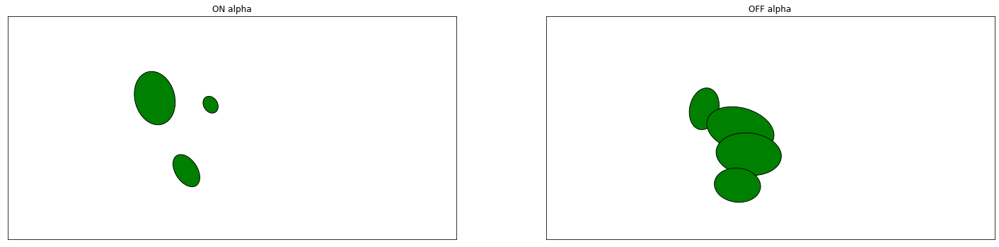

In [19]:
fig, axs = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(25,10))

STIXEL = vcd.get_runtimemovie_params().pixelsPerStixelX
cell_types = ['ON alpha', 'OFF alpha']

for ax, cell_type in zip(axs, cell_types):
    for c1 in vcd.get_all_cells_similar_to_type(cell_type):
        center_x = STIXEL * vcd.get_stafit_for_cell(c1).center_x
        center_y = STIXEL * (int(vcd.get_runtimemovie_params().height) - vcd.get_stafit_for_cell(c1).center_y)
        std_x = STIXEL * vcd.get_stafit_for_cell(c1).std_x
        std_y = STIXEL * vcd.get_stafit_for_cell(c1).std_y
        rot = vcd.get_stafit_for_cell(c1).rot

        rf1 = Ellipse(xy=(center_x,center_y), width=2*std_x, height=2*std_y, angle=-rot*180/np.pi, fill=True)

        if c1 in selective_stimuli[:,1]:
            rf1.set_facecolor('green')
        else:
            rf1.set_facecolor('red')            
        rf1.set_edgecolor('black')
        ax.add_patch(rf1)

    ax.set_xlim(0, 640-1)
    ax.set_ylim(0, 320-1)
    ax.set_aspect('equal')
    ax.set_title(cell_type)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

plt.show()

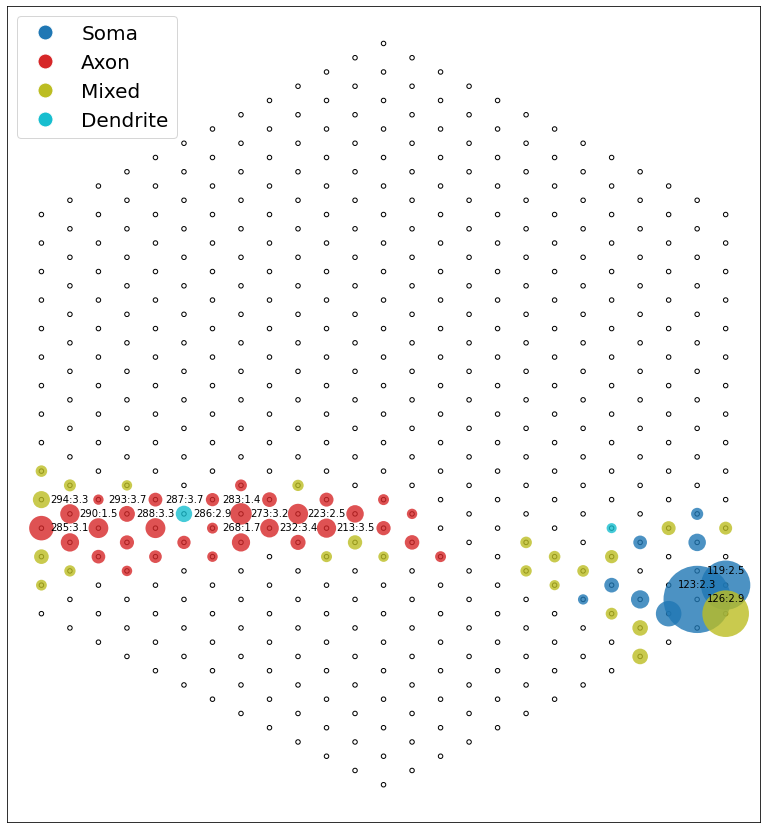

In [24]:
for cell_id in [1832]:

    # Extract EI for desired cell
    cell_ei = vcd.get_ei_for_cell(cell_id).ei

    # Find negative peak for each recording electrode
    ei = np.amin(cell_ei,axis=1)
    thresh = -1
    good_inds = np.argwhere(ei < thresh).flatten()
    channel_noise = vcd.channel_noise

    # Assign compartments
    soma_inds = []
    axon_inds = []
    mixed_inds = []
    dendrite_inds = []
    for elec in good_inds:
        if eil.axonorsomaRatio(cell_ei[elec,:]) == 'soma':
            soma_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'axon':
            axon_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'dendrite':
            dendrite_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'mixed':
            mixed_inds.append(elec)

    fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15,15))

    # Plot electrodes
    coords = vcd.get_electrode_map()
    ax.scatter(coords[:,0], coords[:,1], facecolors='none', edgecolors='k', s=20)

    # Plot EI
    ei_size_factor = -100
    ax.scatter(coords[soma_inds,0], coords[soma_inds,1], facecolors=eil.corrColDict['soma'], 
            edgecolors='none', s=ei[soma_inds]*ei_size_factor, alpha=0.8)
    ax.scatter(coords[axon_inds,0], coords[axon_inds,1], facecolors=eil.corrColDict['axon'], 
            edgecolors='none', s=ei[axon_inds]*ei_size_factor, alpha=0.8)
    ax.scatter(coords[mixed_inds,0], coords[mixed_inds,1], facecolors=eil.corrColDict['mixed'], 
            edgecolors='none', s=ei[mixed_inds]*ei_size_factor, alpha=0.8)
    ax.scatter(coords[dendrite_inds,0], coords[dendrite_inds,1], facecolors=eil.corrColDict['dendrite'], 
            edgecolors='none', s=ei[dendrite_inds]*ei_size_factor, alpha=0.8)

    ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
    # ax.set_xlim([min(coords[good_inds,0])-100, max(coords[good_inds,0])+100])
    # ax.set_ylim([min(coords[good_inds,1])-100, max(coords[good_inds,1])+100])
    ax.axes.set_aspect('equal')


    legend_elements = [Line2D([0], [0], marker='o', color='w', label='Soma',
                    markerfacecolor=eil.corrColDict['soma'], markersize=15),
                    Line2D([0], [0], marker='o', color='w', label='Axon',
                    markerfacecolor=eil.corrColDict['axon'], markersize=15),
                    Line2D([0], [0], marker='o', color='w', label='Mixed',
                    markerfacecolor=eil.corrColDict['mixed'], markersize=15),
                    Line2D([0], [0], marker='o', color='w', label='Dendrite',
                    markerfacecolor=eil.corrColDict['dendrite'], markersize=15)]
    ax.legend(handles=legend_elements, loc='upper left', fontsize=20)

    # Identify from selective_stimuli which electrodes are selective for cell_id, and get the corresponding amp
    selective_subset = selective_stimuli[selective_stimuli[:,1] == cell_id]
    selective_electrodes = selective_subset[:,0].astype(int)
    selective_amps = selective_subset[:,2]

    # Label electrodes
    for z,elec in enumerate(selective_electrodes):
        num = f"{elec}:{selective_amps[z]:.1f}"
        plt.annotate(num, (coords[elec-1,0],coords[elec-1,1]), textcoords='offset points', xytext=(0,12), ha='center', fontsize=10)

    ax.invert_yaxis()
    plt.show()

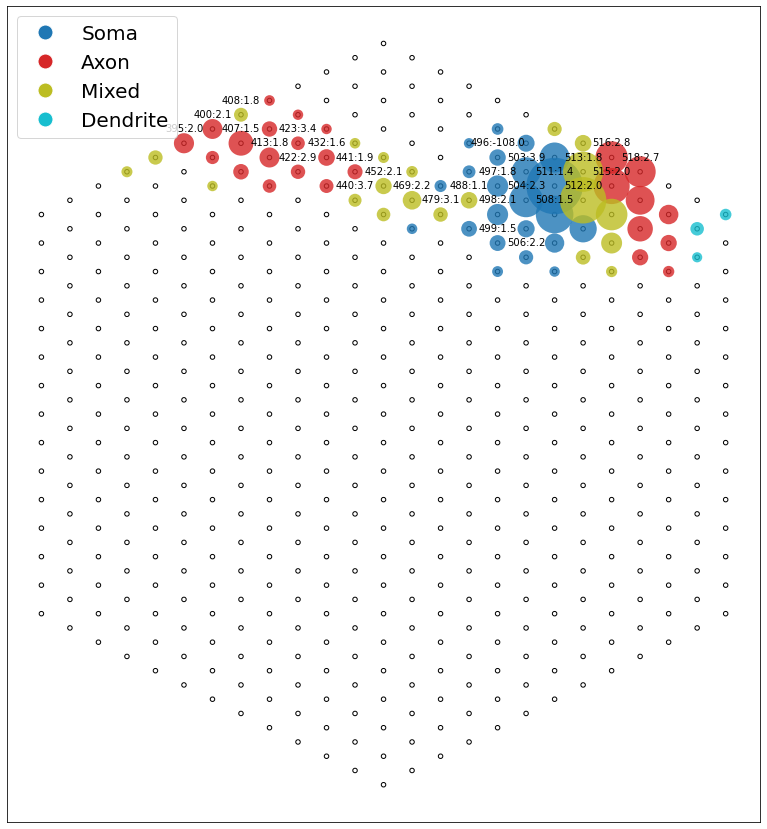

In [30]:
for cell_id in [7651]:

    # Extract EI for desired cell
    cell_ei = vcd.get_ei_for_cell(cell_id).ei

    # Find negative peak for each recording electrode
    ei = np.amin(cell_ei,axis=1)
    thresh = -1
    good_inds = np.argwhere(ei < thresh).flatten()
    channel_noise = vcd.channel_noise

    # Assign compartments
    soma_inds = []
    axon_inds = []
    mixed_inds = []
    dendrite_inds = []
    for elec in good_inds:
        if eil.axonorsomaRatio(cell_ei[elec,:]) == 'soma':
            soma_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'axon':
            axon_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'dendrite':
            dendrite_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'mixed':
            mixed_inds.append(elec)

    fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(15,15))

    # Plot electrodes
    coords = vcd.get_electrode_map()
    ax.scatter(coords[:,0], coords[:,1], facecolors='none', edgecolors='k', s=20)

    # Plot EI
    ei_size_factor = -100
    ax.scatter(coords[soma_inds,0], coords[soma_inds,1], facecolors=eil.corrColDict['soma'], 
            edgecolors='none', s=ei[soma_inds]*ei_size_factor, alpha=0.8)
    ax.scatter(coords[axon_inds,0], coords[axon_inds,1], facecolors=eil.corrColDict['axon'], 
            edgecolors='none', s=ei[axon_inds]*ei_size_factor, alpha=0.8)
    ax.scatter(coords[mixed_inds,0], coords[mixed_inds,1], facecolors=eil.corrColDict['mixed'], 
            edgecolors='none', s=ei[mixed_inds]*ei_size_factor, alpha=0.8)
    ax.scatter(coords[dendrite_inds,0], coords[dendrite_inds,1], facecolors=eil.corrColDict['dendrite'], 
            edgecolors='none', s=ei[dendrite_inds]*ei_size_factor, alpha=0.8)

    ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
    # ax.set_xlim([min(coords[good_inds,0])-100, max(coords[good_inds,0])+100])
    # ax.set_ylim([min(coords[good_inds,1])-100, max(coords[good_inds,1])+100])
    ax.axes.set_aspect('equal')


    legend_elements = [Line2D([0], [0], marker='o', color='w', label='Soma',
                    markerfacecolor=eil.corrColDict['soma'], markersize=15),
                    Line2D([0], [0], marker='o', color='w', label='Axon',
                    markerfacecolor=eil.corrColDict['axon'], markersize=15),
                    Line2D([0], [0], marker='o', color='w', label='Mixed',
                    markerfacecolor=eil.corrColDict['mixed'], markersize=15),
                    Line2D([0], [0], marker='o', color='w', label='Dendrite',
                    markerfacecolor=eil.corrColDict['dendrite'], markersize=15)]
    ax.legend(handles=legend_elements, loc='upper left', fontsize=20)

    # Label electrodes
    # for elec in np.arange(1,520):
    #     num = f"{elec}"
    #     plt.annotate(num, (coords[elec-1,0],coords[elec-1,1]), textcoords='offset points', xytext=(0,12), ha='center', fontsize=10)

    # Label electrodes
    for elec in np.arange(1,520):
        try:
            amps, probs, slp, thr, std, success = sig.compute_sigmoid(gsort_path, pickle_path_base, cell_id, f"p{elec}", plot=False)
            if np.isnan(thr):
                continue
            # if success:
            num = f"{elec}:{thr:.1f}"
            plt.annotate(num, (coords[elec-1,0],coords[elec-1,1]), textcoords='offset points', xytext=(0,12), ha='center', fontsize=10)
        except:
            continue

    ax.invert_yaxis()
    plt.show()

Cell 46


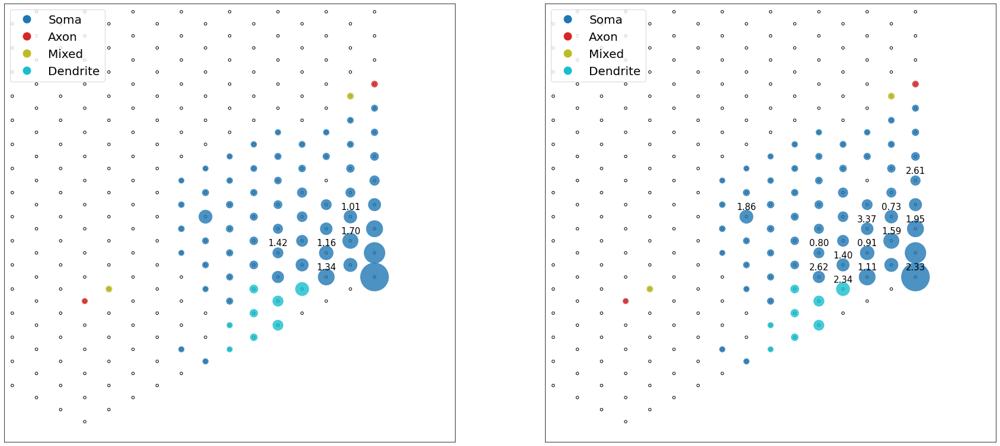

Cell 81


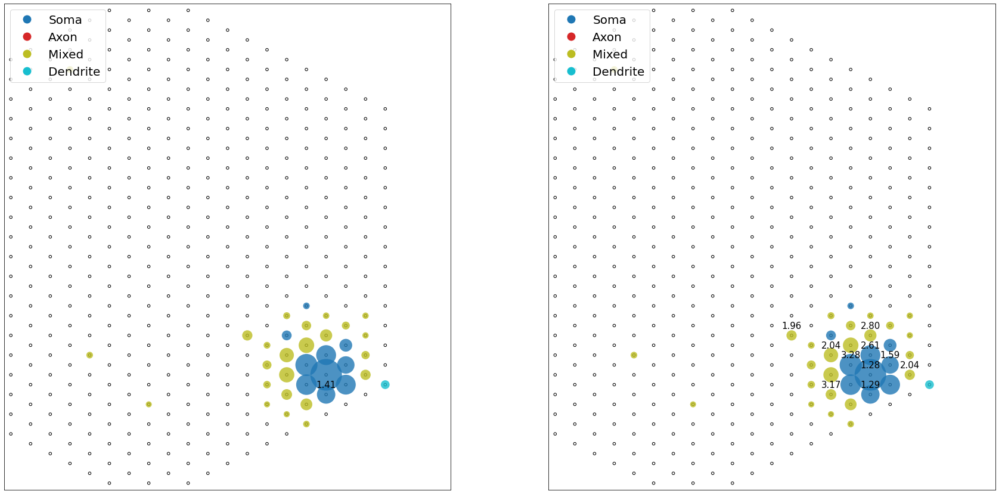

Cell 455


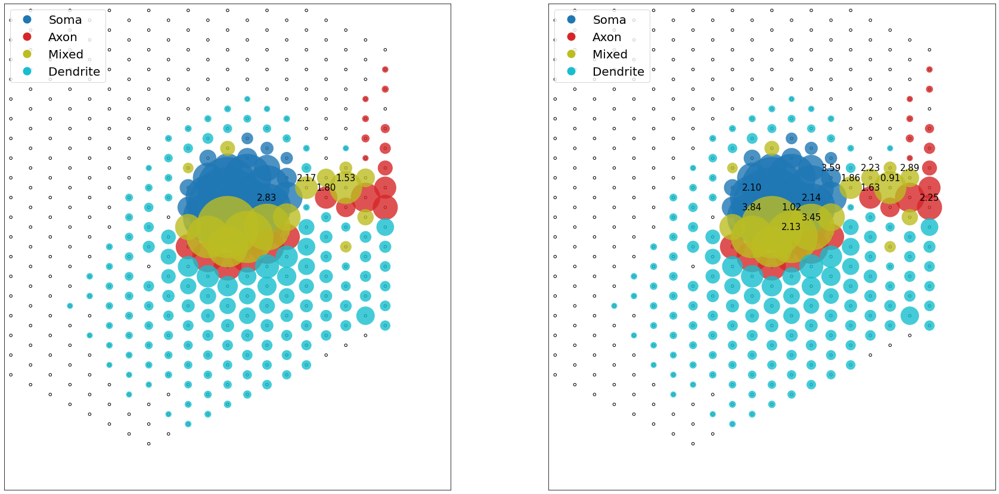

Cell 782


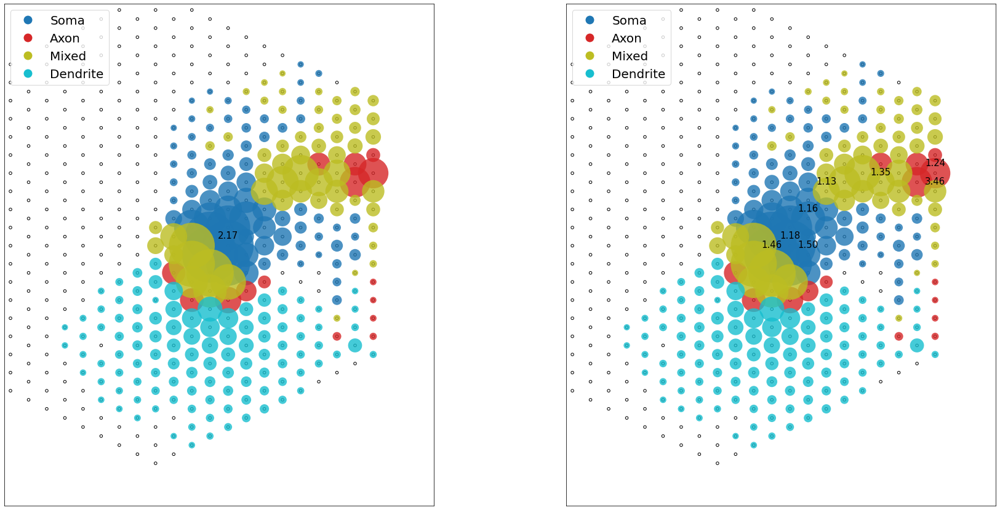

Cell 846


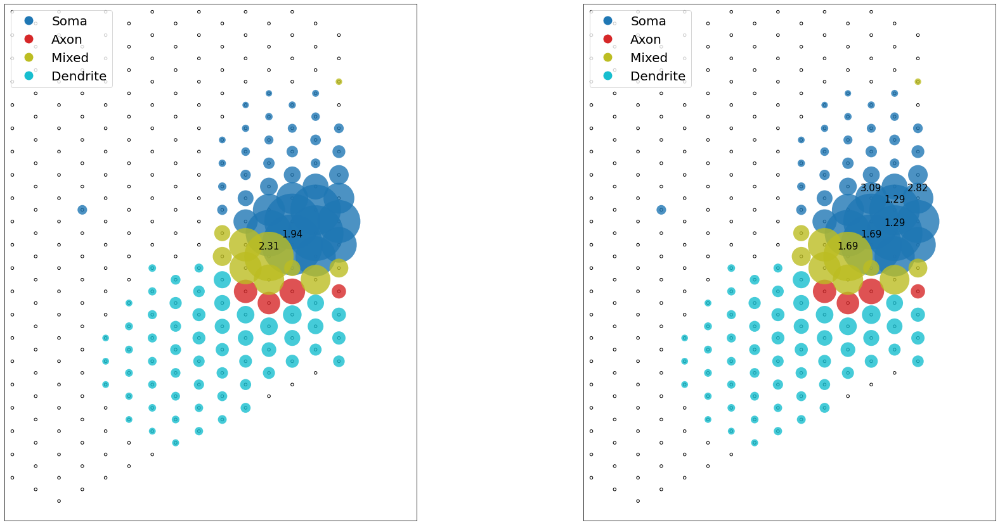

Cell 1235


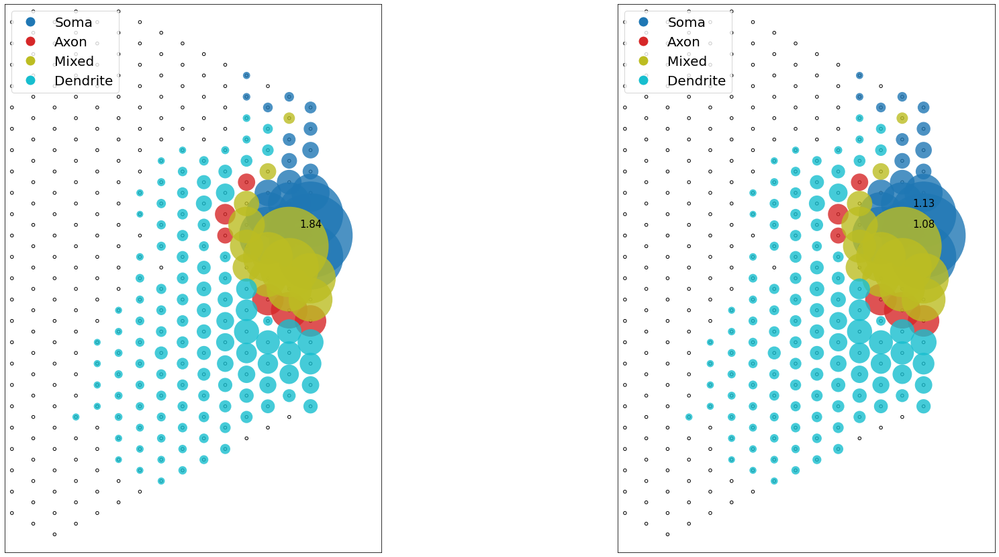

Cell 1261


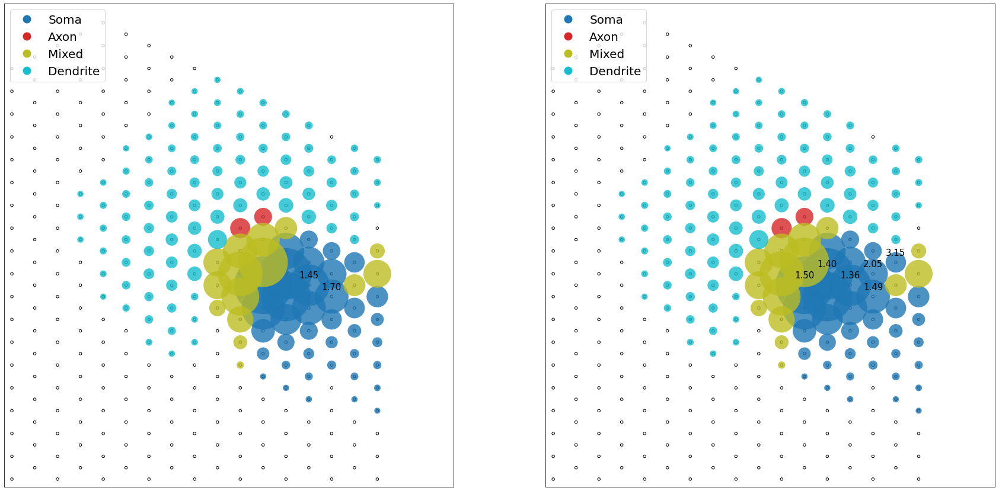

Cell 1912


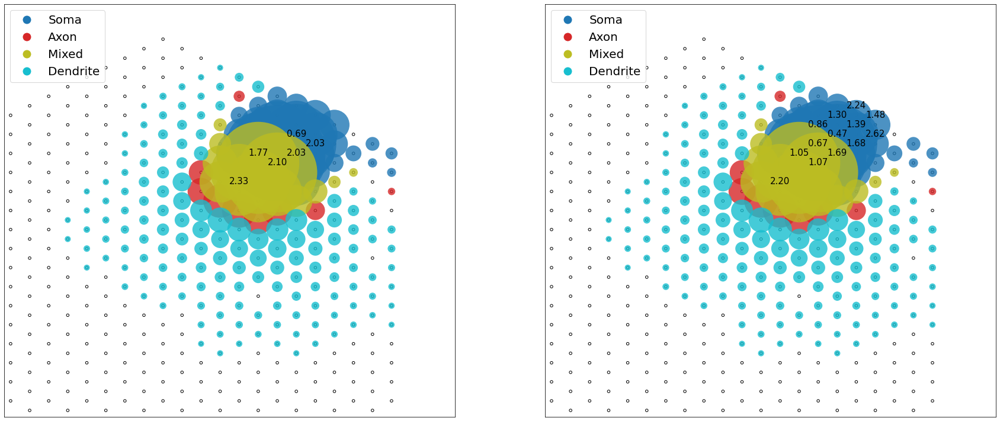

Cell 2359


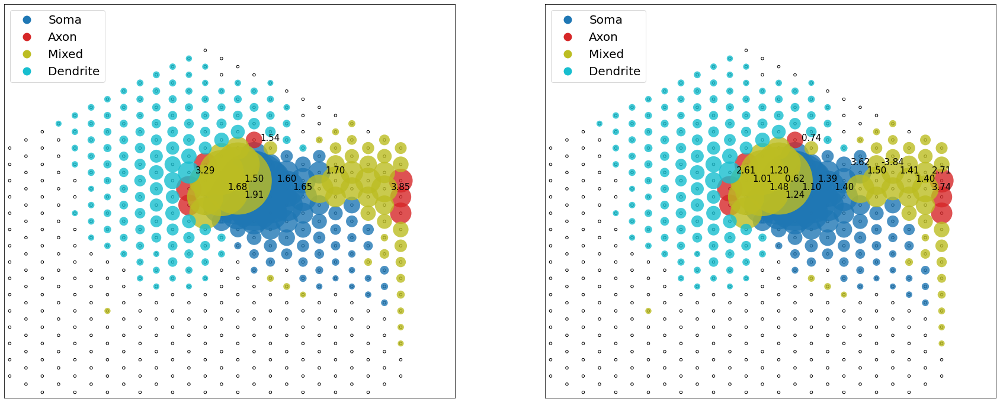

Cell 2416


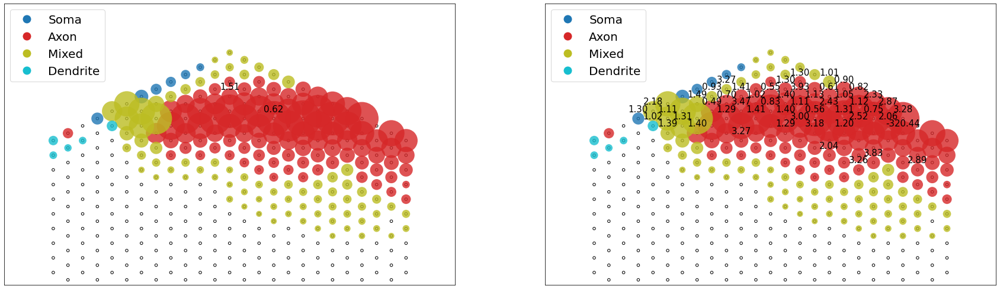

Cell 2611


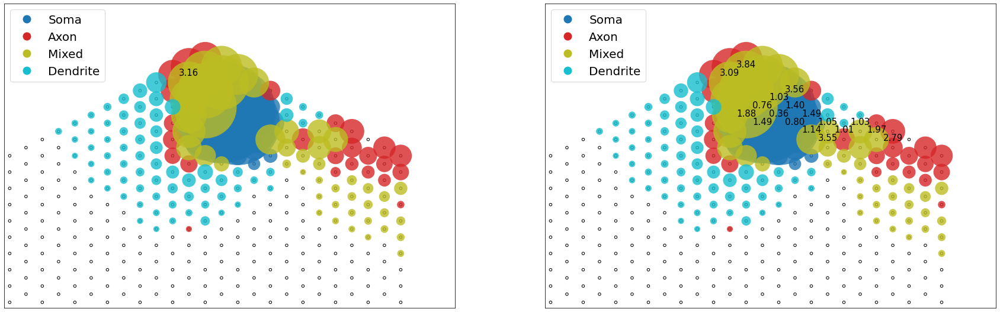

Cell 2749


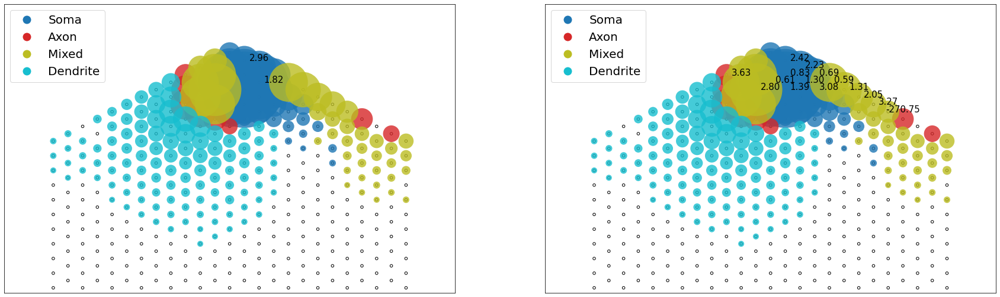

Cell 3348


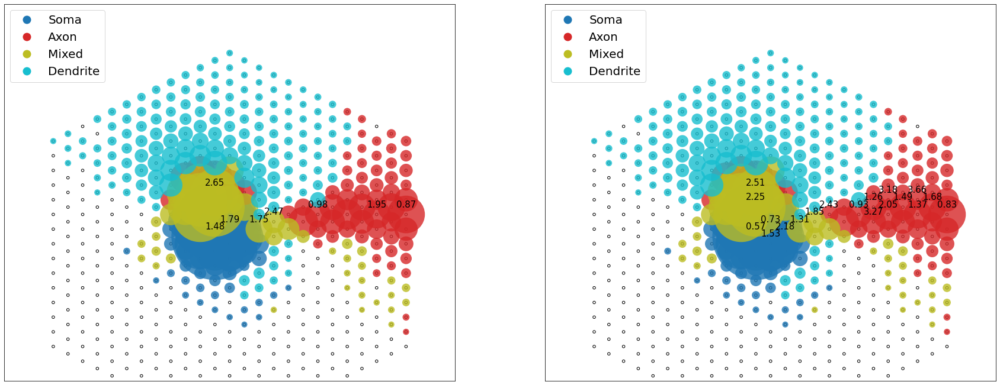

Cell 3544


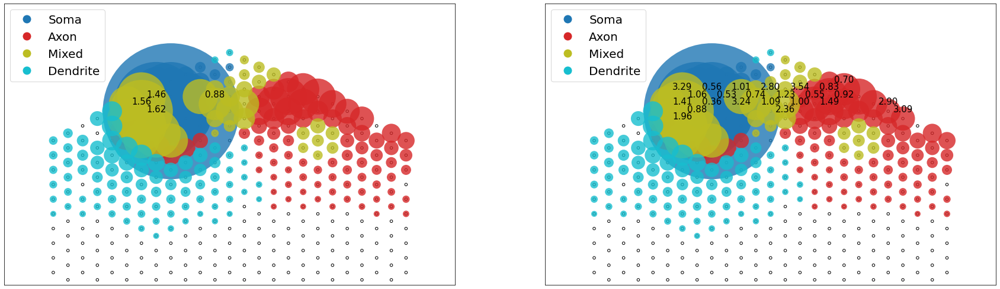

Cell 4051


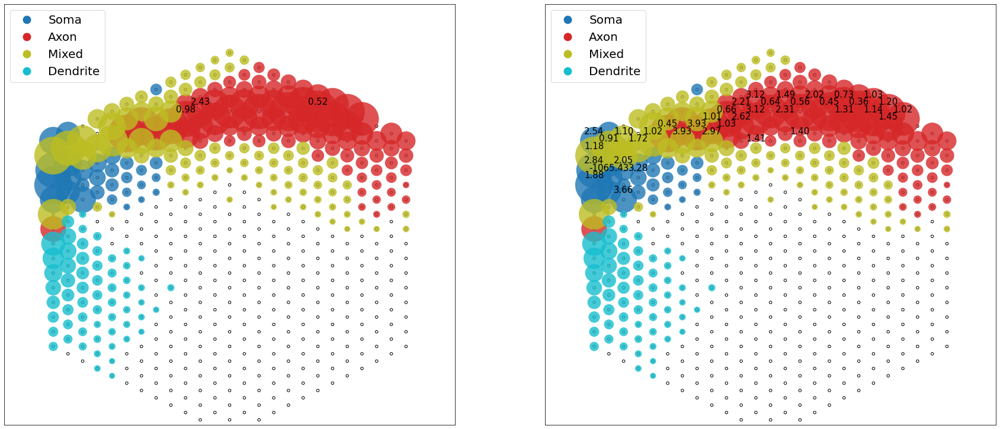

Cell 4068


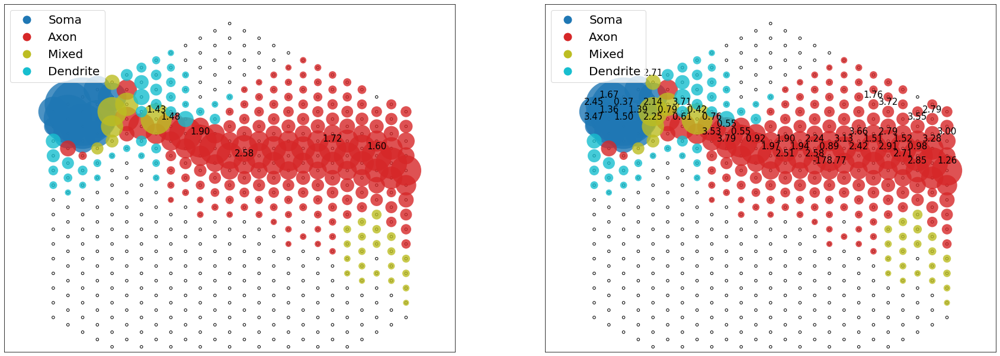

Cell 4412


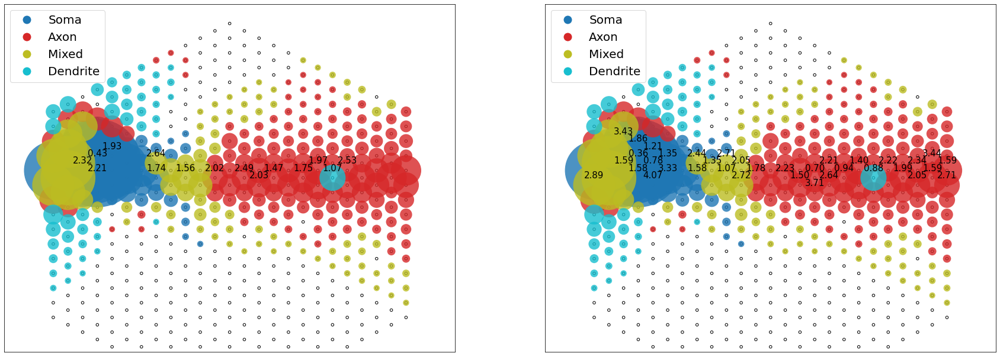

Cell 4516


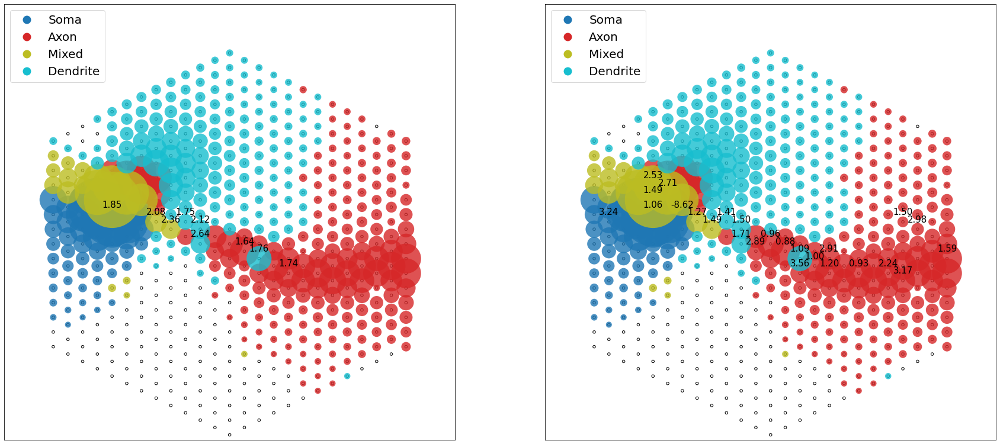

Cell 4699


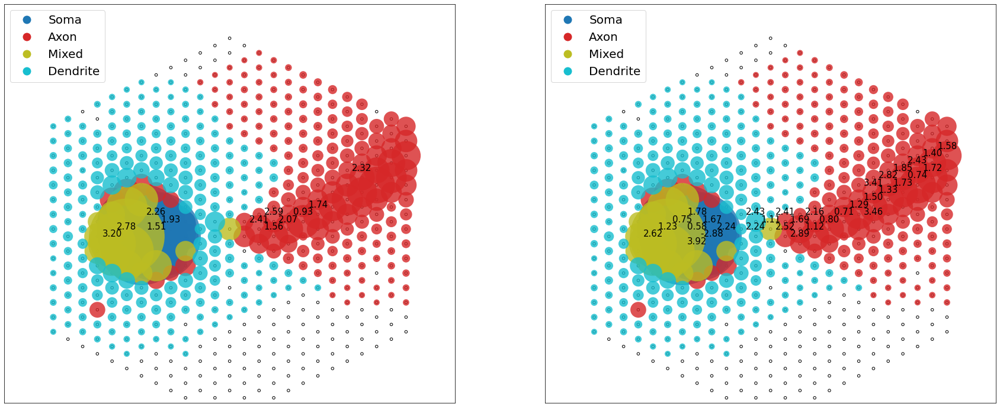

Cell 5087


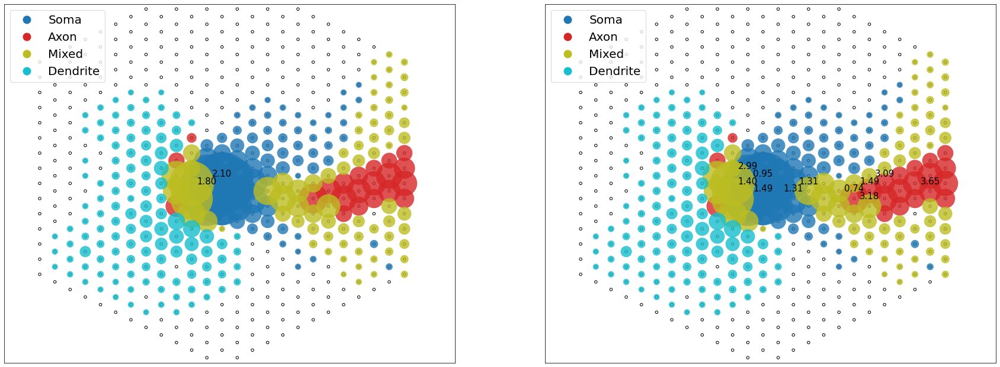

Cell 5313


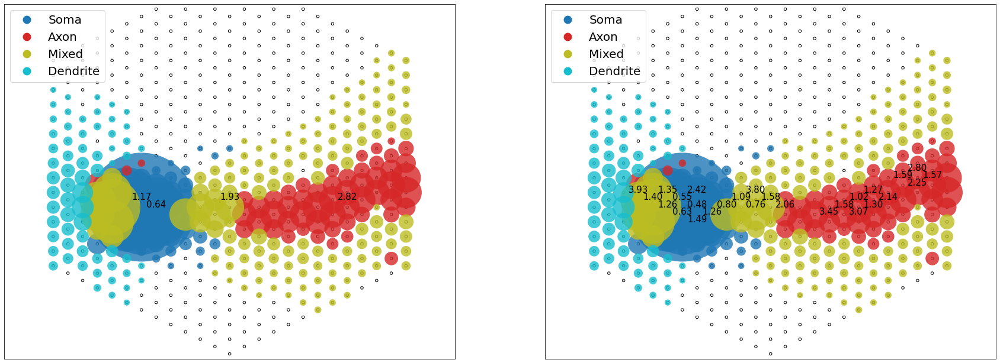

Cell 5538


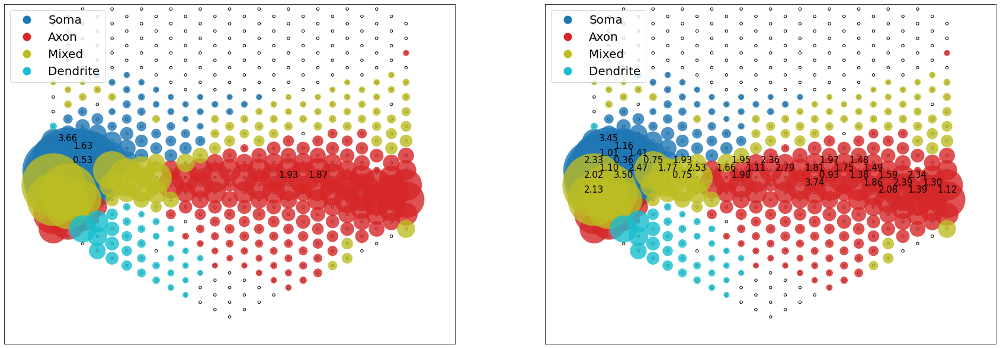

Cell 5672


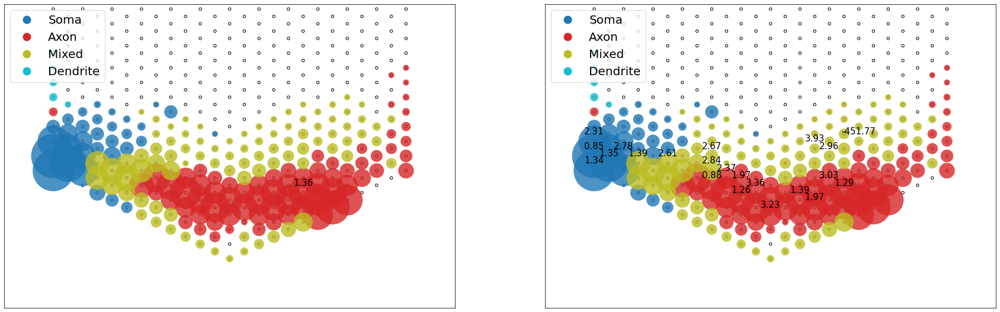

Cell 5806


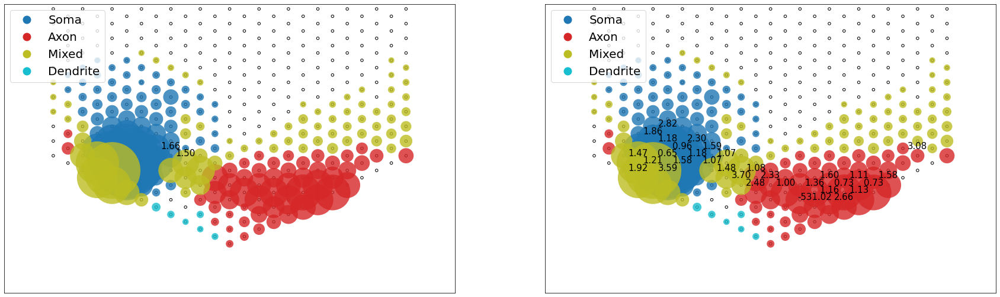

Cell 5912


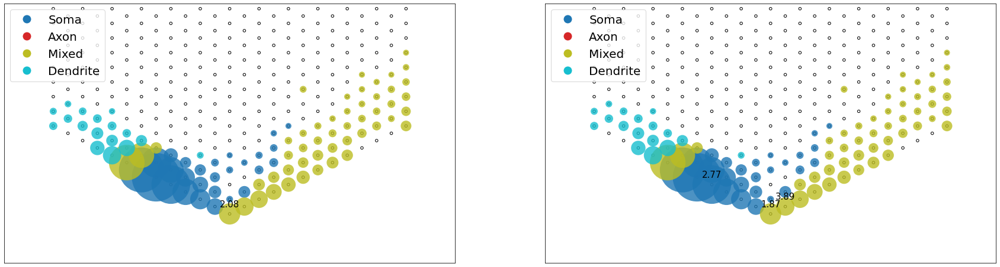

Cell 6258


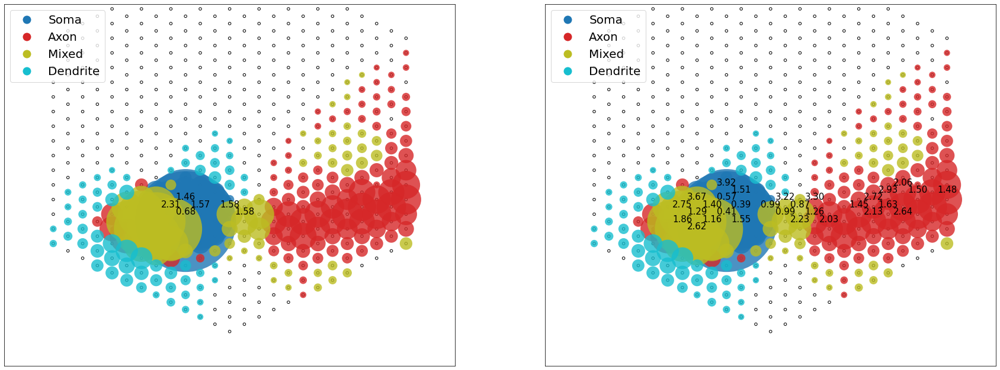

Cell 6512


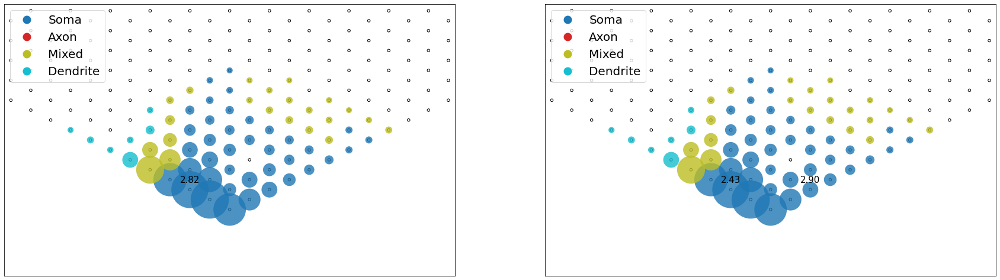

Cell 6856


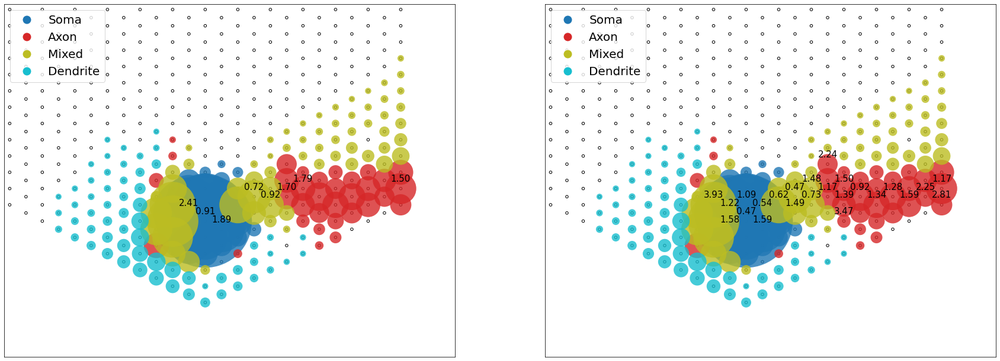

Cell 7163


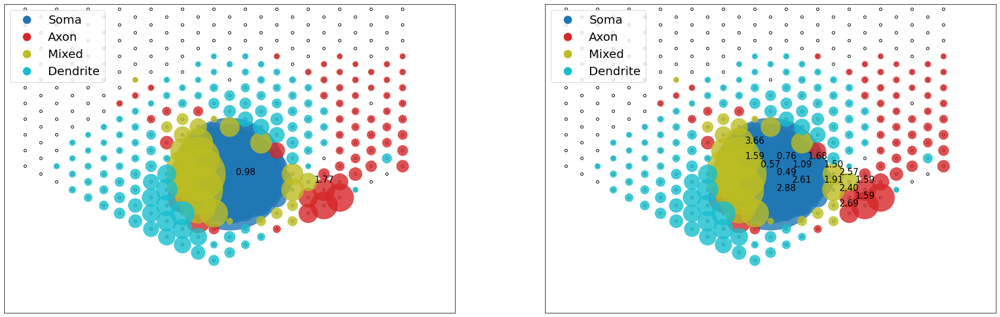

Cell 7517


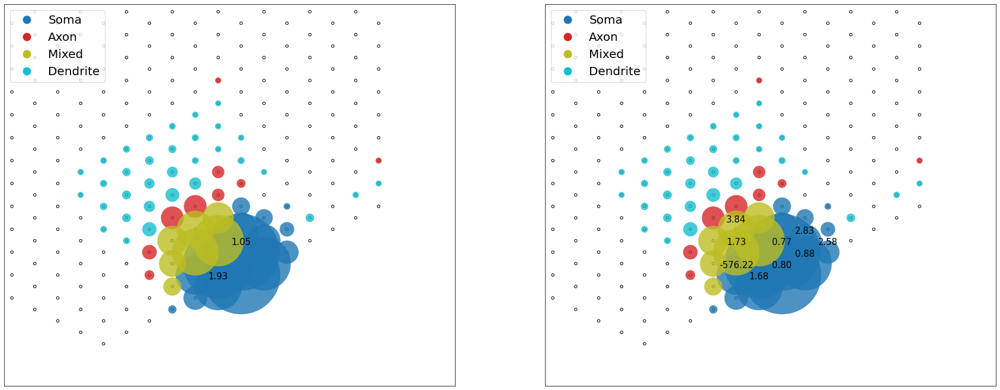

Cell 7729


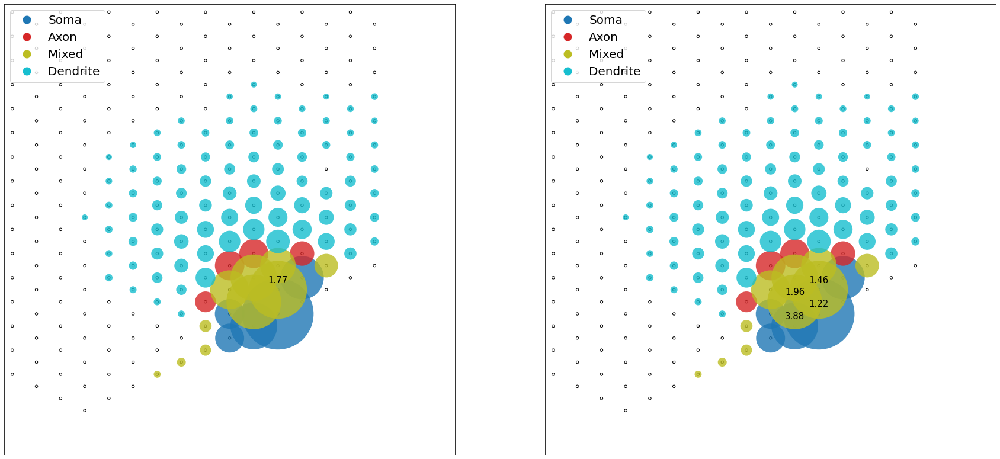

In [61]:
for cell_id in unique_cells.astype(int):

    print(f"Cell {cell_id}")

    # Extract EI for desired cell
    cell_ei = vcd.get_ei_for_cell(cell_id).ei

    # Find negative peak for each recording electrode
    ei = np.amin(cell_ei,axis=1)
    thresh = -1
    good_inds = np.argwhere(ei < thresh).flatten()
    channel_noise = vcd.channel_noise

    # Assign compartments
    soma_inds = []
    axon_inds = []
    mixed_inds = []
    dendrite_inds = []
    for elec in good_inds:
        if eil.axonorsomaRatio(cell_ei[elec,:]) == 'soma':
            soma_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'axon':
            axon_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'dendrite':
            dendrite_inds.append(elec)
        elif eil.axonorsomaRatio(cell_ei[elec,:]) == 'mixed':
            mixed_inds.append(elec)

    fig, axs = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(30,15))

    for y,ax in enumerate(axs):

        # Plot electrodes
        coords = vcd.get_electrode_map()
        ax.scatter(coords[:,0], coords[:,1], facecolors='none', edgecolors='k', s=20)

        # Plot EI
        ei_size_factor = -100
        ax.scatter(coords[soma_inds,0], coords[soma_inds,1], facecolors=eil.corrColDict['soma'], 
                edgecolors='none', s=ei[soma_inds]*ei_size_factor, alpha=0.8)
        ax.scatter(coords[axon_inds,0], coords[axon_inds,1], facecolors=eil.corrColDict['axon'], 
                edgecolors='none', s=ei[axon_inds]*ei_size_factor, alpha=0.8)
        ax.scatter(coords[mixed_inds,0], coords[mixed_inds,1], facecolors=eil.corrColDict['mixed'], 
                edgecolors='none', s=ei[mixed_inds]*ei_size_factor, alpha=0.8)
        ax.scatter(coords[dendrite_inds,0], coords[dendrite_inds,1], facecolors=eil.corrColDict['dendrite'], 
                edgecolors='none', s=ei[dendrite_inds]*ei_size_factor, alpha=0.8)

        ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        ax.tick_params(axis='y', which='both', left=False, right=False, labelleft=False)
        ax.set_xlim([min(coords[good_inds,0])-100, max(coords[good_inds,0])+100])
        ax.set_ylim([min(coords[good_inds,1])-100, max(coords[good_inds,1])+100])
        ax.axes.set_aspect('equal')


        legend_elements = [Line2D([0], [0], marker='o', color='w', label='Soma',
                        markerfacecolor=eil.corrColDict['soma'], markersize=15),
                        Line2D([0], [0], marker='o', color='w', label='Axon',
                        markerfacecolor=eil.corrColDict['axon'], markersize=15),
                        Line2D([0], [0], marker='o', color='w', label='Mixed',
                        markerfacecolor=eil.corrColDict['mixed'], markersize=15),
                        Line2D([0], [0], marker='o', color='w', label='Dendrite',
                        markerfacecolor=eil.corrColDict['dendrite'], markersize=15)]
        ax.legend(handles=legend_elements, loc='upper left', fontsize=20)

        if y == 0:
            # Identify from selective_stimuli which electrodes are selective for cell_id, and get the corresponding amp
            selective_subset = selective_stimuli[selective_stimuli[:,1] == cell_id]
            selective_electrodes = selective_subset[:,0].astype(int)
            selective_amps = selective_subset[:,2]

            # Label electrodes
            for z,elec in enumerate(selective_electrodes):
                num = f"{selective_amps[z]:.2f}"
                ax.annotate(num, (coords[elec-1,0],coords[elec-1,1]), textcoords='offset points', xytext=(0,12), ha='center', fontsize=15)

        elif y == 1:
            # Label electrodes
            for elec in np.arange(1,520):
                try:
                    amps, probs, slp, thr, std, success = sig.compute_sigmoid(gsort_path, pickle_path_base, cell_id, f"p{elec}", plot=False)
                    if np.isnan(thr):
                        continue
                    # if success:
                    num = f"{thr:.2f}"
                    ax.annotate(num, (coords[elec-1,0],coords[elec-1,1]), textcoords='offset points', xytext=(0,12), ha='center', fontsize=15)
                except:
                    continue

    plt.show()